In [3]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Toggle."></form>''')

# Analysis on the google playstore data set

In [1]:
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import scale
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn import svm
from sklearn.linear_model import LogisticRegression
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
import nltk as nlp
from nltk.corpus import stopwords
import nltk
import re
import warnings
import cufflinks as cf
import plotly.figure_factory as ff
from plotly.offline import iplot
import plotly.offline
import plotly.graph_objs as go
import plotly
import seaborn as sns  # for making plots with seaborn
from sklearn.model_selection import train_test_split
from sklearn import metrics
import sklearn
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import HTML

In [32]:
warnings.simplefilter("ignore")

## Importing the dataset

In [3]:
df = pd.read_csv("Google-Playstore.csv")
#print("df = pd.read_csv('google.csv')")
print("Total number of rows in the dataset -", len(df))
#df = df.drop(df.index[9148])
#df.drop_duplicates(subset='App', inplace=True)
#df = df[df['Installs'] != 'Free']
#df = df[df['Installs'] != 'Paid']
df = df.drop(columns=['App Id', 'Rating Count', 'Minimum Installs', 'Maximum Installs', 'Currency', 'Developer Id',
                      'Developer Website', 'Developer Email', 'Last Updated', 'Privacy Policy', 'Ad Supported', 'In App Purchases', 'Editors Choice', 'Released'])
df = df.rename(columns={"Free": "Type"})
df = df[df['Rating'] != 0.0]
df.dropna(inplace=True)
#print("Number of rows after dropping the duplicates -", len(df))
# df.drop_duplicates(subset='App',inplace=True)

Total number of rows in the dataset - 1118136


# The dataset

In [4]:
df

,App Name,Category,Rating,Installs,Type,Price,Size,Minimum Android,Content Rating
0,HTTrack Website Copier,Communication,3.6,"100,000+",True,0.0,2.7M,2.3 and up,Everyone
1,World War 2: Offline Strategy,Strategy,4.3,"1,000,000+",True,0.0,86M,5.1 and up,Everyone 10+
2,WPSApp,Tools,4.2,"50,000,000+",True,0.0,5.8M,4.1 and up,Everyone
3,"OfficeSuite - Office, PDF, Word, Excel, PowerP...",Business,4.2,"100,000,000+",True,0.0,59M,4.4 and up,Everyone
4,Loud Player Free,Music & Audio,4.2,"50,000+",True,0.0,29M,5.0 and up,Everyone
...,...,...,...,...,...,...,...,...,...
1118111,Sale DSR,Business,3.7,"1,000+",True,0.0,6.8M,4.0.3 and up,Everyone
1118118,Wall Jump,Casual,5.0,50+,True,0.0,15M,4.4 and up,Everyone
1118119,BOSS Home Appliances,Shopping,4.2,"1,000+",True,0.0,8.3M,4.1 and up,Everyone
1118122,Shree Sen Samaj,Social,4.6,"1,000+",True,0.0,12M,4.1 and up,Everyone


## DATA CLEANING

In [5]:

df.head(15)

,App Name,Category,Rating,Installs,Type,Price,Size,Minimum Android,Content Rating
0,HTTrack Website Copier,Communication,3.6,"100,000+",True,0.0,2.7M,2.3 and up,Everyone
1,World War 2: Offline Strategy,Strategy,4.3,"1,000,000+",True,0.0,86M,5.1 and up,Everyone 10+
2,WPSApp,Tools,4.2,"50,000,000+",True,0.0,5.8M,4.1 and up,Everyone
3,"OfficeSuite - Office, PDF, Word, Excel, PowerP...",Business,4.2,"100,000,000+",True,0.0,59M,4.4 and up,Everyone
4,Loud Player Free,Music & Audio,4.2,"50,000+",True,0.0,29M,5.0 and up,Everyone
5,eCharge+,Maps & Navigation,3.5,"10,000+",True,0.0,12M,6.0 and up,Everyone
6,Jobonji: hire local pros handyman for odd jobs...,Lifestyle,4.4,"100,000+",True,0.0,9.4M,5.0 and up,Everyone
7,Little Panda’s Dream Town,Educational,4.0,"10,000,000+",True,0.0,90M,4.2 and up,Everyone
8,Baby Panda: Dental Care,Educational,4.1,"10,000,000+",True,0.0,87M,4.2 and up,Everyone
9,Excel Reader,Tools,3.3,"100,000+",True,0.0,3.3M,5.0 and up,Everyone


### SIZE<br>


The Size table initially looks as follows

In [6]:
df['Size']

0          2.7M
1           86M
2          5.8M
3           59M
4           29M
           ... 
1118111    6.8M
1118118     15M
1118119    8.3M
1118122     12M
1118135    8.8M
Name: Size, Length: 677217, dtype: object

We eliminate the special characters '+' and ','. We also remove the units i.e 'M' and 'k'<br>
We also convert the values to float.<br>
<br>
The size column after the transformation looks as follows.

In [7]:
df['Size'] = df['Size'].apply(lambda x: str(x).replace(
    'Varies with device', 'NaN') if 'Varies with device' in str(x) else x)
df['Size'] = df['Size'].apply(lambda x: str(
    x).replace('M', '') if 'M' in str(x) else x)
df['Size'] = df['Size'].apply(lambda x: str(
    x).replace('G', '') if 'G' in str(x) else x)
df['Size'] = df['Size'].apply(lambda x: str(
    x).replace(',', '') if ',' in str(x) else x)
# df['Size'] = df['Size'].apply(lambda x: int(x) if int(x) > 1000)
df['Size'] = df['Size'].apply(lambda x: float(
    str(x).replace('k', '')) / 1000 if 'k' in str(x) else x)
df['Size'] = df['Size'].astype(float)
df['Size']

0           2.7
1          86.0
2           5.8
3          59.0
4          29.0
           ... 
1118111     6.8
1118118    15.0
1118119     8.3
1118122    12.0
1118135     8.8
Name: Size, Length: 677217, dtype: float64

===========================================================================

### INSTALLS

Installs table before transformation. we observe it has commas and plus signs.

In [8]:
df.Installs

0              100,000+
1            1,000,000+
2           50,000,000+
3          100,000,000+
4               50,000+
               ...     
1118111          1,000+
1118118             50+
1118119          1,000+
1118122          1,000+
1118135         10,000+
Name: Installs, Length: 677217, dtype: object

We remove the '+' signs and the ',' from every entry and convert object type to float.<br>
This is how the updated installs column appears.

In [9]:
df.Installs = df.Installs.apply(lambda x: str(x).strip('+'))
df.Installs = df.Installs.apply(lambda x: str(x).replace(',', ''))
df.Installs = df.Installs.replace('Free', np.nan)
df.Installs = df.Installs.astype(float)
df.Installs

0             100000.0
1            1000000.0
2           50000000.0
3          100000000.0
4              50000.0
              ...     
1118111         1000.0
1118118           50.0
1118119         1000.0
1118122         1000.0
1118135        10000.0
Name: Installs, Length: 677217, dtype: float64

==================================================================

### RATINGS

In [10]:
df['Rating'] = df['Rating'].apply(lambda x: str(
    x).replace('0.0', 'NaN') if '0.0' in str(x) else x)

In [11]:
print("Range of ratings: ", df.Rating.min(), "-", df.Rating.max())

Range of ratings:  1.0 - 5.0


In [12]:
print(df.Rating.isna().sum(), "null values out of", len(df.Rating))

0 null values out of 677217


In [13]:
df.Rating.fillna(method="ffill")

0          3.6
1          4.3
2          4.2
3          4.2
4          4.2
          ... 
1118111    3.7
1118118    5.0
1118119    4.2
1118122    4.6
1118135    4.6
Name: Rating, Length: 677217, dtype: float64

In [14]:
df.Rating.astype(float)

0          3.6
1          4.3
2          4.2
3          4.2
4          4.2
          ... 
1118111    3.7
1118118    5.0
1118119    4.2
1118122    4.6
1118135    4.6
Name: Rating, Length: 677217, dtype: float64

The ratings column after transformation.

### TYPE

In [15]:
df.Type.value_counts()

True     653329
False     23888
Name: Type, dtype: int64

In [16]:
df.Type

0          True
1          True
2          True
3          True
4          True
           ... 
1118111    True
1118118    True
1118119    True
1118122    True
1118135    True
Name: Type, Length: 677217, dtype: bool

#### Conversion to Free and Paid

In [17]:
df['Type'] = df['Type'].apply(lambda x: str(x).replace(
    'True', 'Free') if 'True' in str(x) else str(x).replace('False', 'Paid'))
df.Type.astype(str)

0          Free
1          Free
2          Free
3          Free
4          Free
           ... 
1118111    Free
1118118    Free
1118119    Free
1118122    Free
1118135    Free
Name: Type, Length: 677217, dtype: object

============================================================================

### PRICE

The price column has '$' sign to denote the currency. We remove the sign from every entry.

In [18]:
df.Price.unique()

array([  0.  ,   1.49,   2.99,   3.99,   1.36,   1.99,   7.99,   4.99,
         5.  ,   5.49,   9.99,   0.99,   4.49,  14.99,   1.34,   6.  ,
        19.99,   2.79,   1.5 ,   1.35,   2.49,   1.45,   5.99,   6.99,
         8.99,   1.98,   3.49,   6.49,  24.99,   3.24,   4.89,  21.99,
        12.99,   1.59,   9.95,  18.99,   1.  ,   1.29,   1.84,   3.29,
         7.49,   2.31,   8.28,   3.59,  20.99,   1.95,   1.25,   1.69,
         3.75,  69.  ,  12.49,  29.99,   2.5 ,  13.99,  49.  ,  39.99,
         8.49,   1.3 ,   9.49,  54.99,   2.89,   4.  ,   1.19,  16.99,
        17.99,  10.99,   1.2 ,  11.99,  12.35,  26.99,  22.99,   4.59,
         1.07,   6.59,   2.14,  15.99,  37.99,   3.  ,   1.78,   2.  ,
         5.95,  17.98,   2.95,   3.95,   3.89,  34.99,   3.32,  59.99,
         7.73,   1.1 ,   2.98,   1.97,  12.  ,   2.74,   4.69,   4.85,
        28.99,   5.85,   1.48,  11.45,   7.56,  27.99,   1.21,  19.49,
        10.  ,  32.99,   2.39,   2.36,   2.1 ,   1.6 ,  64.99,  40.99,
      

In [19]:
df.Price = df.Price.astype(str).str.replace('$', '')
df.Price = df.Price.astype(float)

The updated Price column -

In [20]:
df.Price.dtype

dtype('float64')

### We observe there are some applications that are placed over 200 dollars we will take a look at them.

In [21]:
temp = df.Price.apply(lambda x: True if float(x) >= 200 else False)
df[temp]

,App Name,Category,Rating,Installs,Type,Price,Size,Minimum Android,Content Rating
67378,Wheel It Off,Maps & Navigation,4.0,50.0,Paid,299.99,15.000,5.0 and up,Everyone
106902,☠️☠️⚠️⚠️Old version of Nzb Leech⚠️⚠️☠️☠️,Communication,4.1,10000.0,Paid,374.99,NaN,Varies with device,Everyone
115317,[Legacy] Alarmy (Sleep If U Can),Lifestyle,4.1,10000.0,Paid,379.99,42.000,4.4 and up,Everyone
121671,Restaurant POS (Paid),Business,4.5,500.0,Paid,329.99,16.000,4.2 and up,Everyone
168519,Plasma duct - Premium Game,Puzzle,3.6,1000.0,Paid,399.99,18.000,4.0.3 and up,Everyone
216091,JAVAD Mobile Tools,Tools,3.6,1000.0,Paid,389.99,37.000,4.4 and up,Everyone
269559,The Elite Royal,Sports,4.5,50.0,Paid,299.90,3.100,4.0.3 and up,Everyone
271842,Series Addict Pro - TV Guide,Entertainment,4.1,500.0,Paid,399.99,5.400,5.0 and up,Teen
461407,Challenge Impossible Ball for you,Arcade,5.0,1.0,Paid,399.99,11.000,4.1 and up,Everyone
714205,The Deluxe Royale,Entertainment,4.8,100.0,Paid,299.90,3.200,4.0.3 and up,Everyone


These are non functional status quo applications. These are junk applications that cause unnecessary bias in the model.<br>
Therefore we drop these rows from the dataset later.

=====================================================================================

### CATEGORY

All categories of apps in the dataset

In [22]:
df.Category.unique()

array(['Communication', 'Strategy', 'Tools', 'Business', 'Music & Audio',
       'Maps & Navigation', 'Lifestyle', 'Educational', 'Productivity',
       'News & Magazines', 'Food & Drink', 'Photography',
       'Books & Reference', 'Shopping', 'Board', 'Sports',
       'Health & Fitness', 'House & Home', 'Medical', 'Education',
       'Auto & Vehicles', 'Finance', 'Parenting', 'Travel & Local',
       'Personalization', 'Entertainment', 'Video Players & Editors',
       'Puzzle', 'Casual', 'Arcade', 'Music', 'Trivia', 'Action',
       'Simulation', 'Racing', 'Weather', 'Role Playing', 'Adventure',
       'Social', 'Word', 'Comics', 'Art & Design', 'Card',
       'Libraries & Demo', 'Casino', 'Beauty', 'Dating', 'Events'],
      dtype=object)

### CONTENT RATING

Content ratings of applications of apps across the playstore

In [23]:
df["Content Rating"].unique()

array(['Everyone', 'Everyone 10+', 'Teen', 'Mature 17+',
       'Adults only 18+', 'Unrated'], dtype=object)

In [24]:
df["Content Rating"].value_counts()

Everyone           580156
Teen                63225
Mature 17+          20455
Everyone 10+        13286
Unrated                58
Adults only 18+        37
Name: Content Rating, dtype: int64

Since the summation adds up to the total number of entries in the dataset it is clear that there is no incorrect data in the content ratign column.

## Android Version

In [25]:
df = df.rename(columns={"Minimum Android": "Android"})
df.Android = df.Android.apply(lambda x: str(x).strip(' and up'))
# = df['text'].str.split('::').str[0]
df.Android = df.Android.apply(lambda x: str(x).replace(
    'Varies with device', 'NaN') if 'Varies with device' in str(x) else x)
df.Android = df.Android.apply(lambda x: str(
    x).split(' and ')[0].split(' - ')[0])
df.Android = df.Android.replace('4.4W', '4.4')
df.Android = df.Android.replace('4.0.3', '4.0')
df.Android = df.Android.replace('2.3.3', '2.3')
df.Android = df.Android.replace('2.0.1', '2.0')
#data['Version_end']=data.Android_Ver.apply(lambda x:str(x).split(' and ')[-1].split(' - ')[-1])
df = df[df['Android'] != '']
df.Android = df.Android.astype(float)
df.Android.unique()

array([2.3, 5.1, 4.1, 4.4, 5. , 6. , 4.2, 4. , nan, 8. , 7. , 3.2, 1.5,
       4.3, 2.2, 2.1, 7.1, 3. , 1.6, 2. , 3.1, 1. , 1.1])

In [26]:
sns.set(rc={'figure.figsize': (11.7, 8.27)})

## The Dataset after transformation

In [27]:
df

,App Name,Category,Rating,Installs,Type,Price,Size,Android,Content Rating
0,HTTrack Website Copier,Communication,3.6,100000.0,Free,0.0,2.7,2.3,Everyone
1,World War 2: Offline Strategy,Strategy,4.3,1000000.0,Free,0.0,86.0,5.1,Everyone 10+
2,WPSApp,Tools,4.2,50000000.0,Free,0.0,5.8,4.1,Everyone
3,"OfficeSuite - Office, PDF, Word, Excel, PowerP...",Business,4.2,100000000.0,Free,0.0,59.0,4.4,Everyone
4,Loud Player Free,Music & Audio,4.2,50000.0,Free,0.0,29.0,5.0,Everyone
...,...,...,...,...,...,...,...,...,...
1118111,Sale DSR,Business,3.7,1000.0,Free,0.0,6.8,4.0,Everyone
1118118,Wall Jump,Casual,5.0,50.0,Free,0.0,15.0,4.4,Everyone
1118119,BOSS Home Appliances,Shopping,4.2,1000.0,Free,0.0,8.3,4.1,Everyone
1118122,Shree Sen Samaj,Social,4.6,1000.0,Free,0.0,12.0,4.1,Everyone


# EDA ON THE DATASET

### Pairplot of all numeric relations

In [28]:
x = df['Rating'].dropna()
y = df['Size'].dropna()
z = df['Installs'][df.Installs != 0].dropna()
#p = df['Reviews'][df.Reviews!=0].dropna()
t = df['Type'].dropna()
price = df['Price']

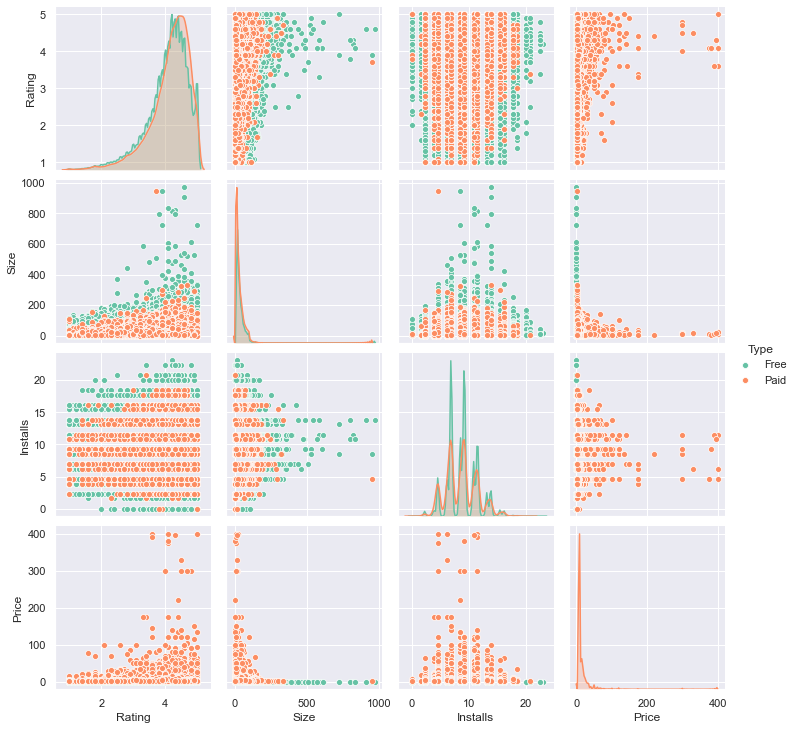

In [29]:
plot = sns.pairplot(pd.DataFrame(list(zip(x, y, np.log(z), t, price)),
                                 columns=['Rating', 'Size', 'Installs', 'Type', 'Price']), hue='Type', palette="Set2")

The heatmap represents the correlation of all of important attributes based on the type of the application. It is a general comparison of attributes for free and paid applications.<br>
All of the figures given above represent the gradual change in values of attributes in the dataset in accordance to the number of applications.<br>


## Frequency dist and histograms of attributes

#### Frequency Distribution of categories of apps in the playstore

In [33]:
df['Category'].value_counts().iplot(kind='bar', title='Frequency',
                                    xTitle='Category', yTitle='number of app')

Exception: chart_studio is required outside of offline mode: please run pip install chart_studio

#### Frequency Distribution of Content Ratings across all apps in the playstore

In [31]:
df['Content Rating'].value_counts().iplot(kind='bar', title='Frequency',
                                          xTitle='Rating', yTitle='number of app')

Exception: chart_studio is required outside of offline mode: please run pip install chart_studio

#### Number of Applications by Content Rating

distribution of ratings

In [34]:
data = [go.Histogram(
        x=df.Rating,
        xbins={'start': 1, 'size': 0.1, 'end': 5}
        )]

In [35]:
print('Average app rating = ', np.mean(df['Rating']))
plotly.offline.iplot(data, filename='overall_rating_distribution')

Average app rating =  4.081810852355263


#### Frequency Distribution of Ratings across all applications

Distribution of Installs

In [ ]:
sns.set(rc={'figure.figsize': (11.7, 8.27)})
sns.countplot('Installs', data=df)

#### This graph denotes the distribution of apps accroding to their number of downloads/installs.

In [ ]:
df['Android'].value_counts().iplot(kind='bar', title='Frequency',
                                   xTitle='Android Version', yTitle='count of apps based on Android version')

### Distribution of Applications according to Android Versions

## Sizing Strategy

### Ratings by size

In [ ]:
sns.set_style("darkgrid")
ax = sns.jointplot(df['Size'], df['Rating'], height=10)

#### Most top rated apps are optimally sized between ~2MB to ~40MB - neither too light nor too heavy.

In [ ]:
sns.set_style('darkgrid')
fig, ax = plt.subplots()
fig.set_size_inches(16, 8)
p = sns.stripplot(x="Size", y="Category", data=df, linewidth=1)
title = ax.set_title('App sizing trend across categories')

#### This graph show the size trend accross the category. We can infer that most apps are sized below 30mb.

Size distribution by category

In [ ]:
subset_df = df[df.Category.isin(['Sports', 'Arcade', 'Action', 'Simulation',
                                 'Role Playing', 'Strategy', 'Racing', 'Education', 'Music', 'Art & Design'])]
sns.set_style('darkgrid')
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
p = sns.stripplot(x="Size", y="Category", data=subset_df, linewidth=1)
title = ax.set_title('App sizing trend across popular categories')

#### This graphs show the size trend in the 2 most popular category. We can see that many apps in these 2 categories are sized well above 20mb which hints that these 2 categories are bulky on purpose. We'll check the impact of this on the ratings in the next graph.

Sizing of games

In [ ]:
subset_df = df[df.Size > 40]
subset_df = subset_df[df.Category.isin(
    ['Sports', 'Arcade', 'Action', 'Simulation', 'Role Playing', 'Strategy', 'Racing'])]
sns.set_style('darkgrid')
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
p = sns.stripplot(x="Size", y="Category", data=subset_df, linewidth=1)
p.set()
title = ax.set_title('App sizing trend across gaming category')

#### App sizing trends for the games category we can observe that games tend to be a heavy size category on purpose. The ratings are not affected even if the size of the app is more that average.

Sizing of Family

In [ ]:
subset_df = df[df.Size > 40]
subset_df = subset_df[df.Category.isin(
    ['Education', 'Music', 'Art & Design', 'Entertainment'])]
sns.set_style('darkgrid')
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
p = sns.stripplot(x="Size", y="Category", data=subset_df, linewidth=1)
p.set()
title = ax.set_title('App sizing trend across Entertainment category')

#### App sizing trends for the games category we can observe that games tend to be a heavy size category on purpose. The ratings are not affected even if the size of the app is more that average.

### Aggregating all game categories into a single category

In [ ]:
def type_cat(category):
    if category in ['Sports', 'Arcade', 'Action', 'Simulation', 'Role Playing', 'Strategy', 'Racing', 'Board', 'Puzzle', 'Casual', 'Adventure', 'Card']:
        return 'Gaming'
    else:
        return category

In [ ]:
df['Category'] = df['Category'].map(type_cat)
df.Category

In [ ]:
sns.set_style('darkgrid')
subset_df = df[df.Size > 40]
subset_df = subset_df[df.Category.isin(['Gaming'])]
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
p = sns.stripplot(x="Size", y="Category", data=subset_df, linewidth=1)
p.set()
title = ax.set_title('App sizing trend across Gaming category')

Ratings by size in Gaming Category

In [ ]:
sns.set(rc={'figure.figsize': (11.7, 8.27)})
subset_df = subset_df[df.Category.isin(['Gaming'])]
sns.set_style("darkgrid")
ax = sns.jointplot(subset_df['Size'], subset_df['Rating'], height=10)
ax.fig.suptitle("Effect of size on Ratings - Gaming")

### Most bulky apps ( >50MB) belong to the Game and Family category. Despite this, these bulky apps are fairly highly rated indicating that they are bulky for a purpose.

## Pricing Strategy

In [ ]:
paid_apps = df[df.Price < 100]
p = sns.jointplot("Price", "Rating", paid_apps, height=10)

#### Most top rated apps are optimally priced between 1 - 20 dollars. There are only a very few apps priced above 20 dollars.

Pricing across category

In [ ]:
subset_df = df[df.Category.isin(['Gaming', 'Health & Fitness', 'Medical',
                                 'Music', 'Travel and Local', 'Education', 'Art & Design', 'Entertainment'])]
sns.set_style('darkgrid')
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
p = sns.stripplot(x="Price", y="Category", data=subset_df,
                  jitter=True, linewidth=1)
title = ax.set_title('App pricing trend across categories')

#### Above graph shows the distribution of pricing according to the categories of applications.

#### We can observe some applications that are priced over 200 dollars. Here, we take a look at them.

In [ ]:
temp = df[['Category', 'App Name']][df.Price > 200]
temp

#### These apps are non functional status quo type of apps. These apps create an unwanted bias in the model, therefore we filter them out.

In [ ]:
df = df.drop(df.index[temp])

Pricing after filtering the junk apps

In [ ]:
fig, ax = plt.subplots()
fig.set_size_inches(15, 8)
subset_df_price = subset_df[subset_df.Price < 250]
p = sns.stripplot(x="Price", y="Category",
                  data=subset_df_price, jitter=True, linewidth=1)
title = ax.set_title(
    'App pricing trend across categories - after filtering for junk apps')

#### It is evident that Gaming, Medical, Education and Entertainment apps are the most expensive across the playstore.

In [ ]:
sns.set(rc={'figure.figsize': (15.7, 10.27)})
new_df = df.groupby(['Category', 'Type']).agg(
    {'App Name': 'count'}).reset_index()
ax = sns.countplot(x="Category", hue="Type", data=new_df)
df.groupby(['Category', 'Type']).count()[
    'App Name'].unstack().plot(kind='bar', stacked=True, ax=ax)
ylabel = plt.ylabel('Number of apps')

#### This is the graph of category wise frequency distribution for paid vs free apps. We can see that Family, Games and Medical category have most paid apps.

## Paid Apps downloads

Number of installs for free vs paid apps

In [ ]:
trace0 = go.Box(
    y=np.log10(df['Installs'][df.Type == 'Paid']),
    name='Paid',
    marker=dict(
        color='rgb(214, 12, 140)',
    )
    )
trace1 = go.Box(
    y=np.log10(df['Installs'][df.Type == 'Free']),
    name='Free',
    marker=dict(
        color='rgb(0, 128, 128)',
    )
)
layout = go.Layout(
    title="Number of downloads of paid apps Vs free apps",
    yaxis={'title': 'Number of downloads (log-scaled)'}
)
data = [trace0, trace1]
plotly.offline.iplot({'data': data, 'layout': layout})

### Logarithmic box chart comparing the number of installs of the free and paid apps. Here we can observe that even though free apps are more readily available they aren't downloaded all that much since the gap between the number of downloads isn't huge. This also tells that all the paid apps are very useful or in some cases very essential services.

## Paid apps vs free apps downloads

Number of installs for free vs paid apps

In [ ]:
trace0 = go.Box(
    y=(df['Rating'][df.Type == 'Paid']),
    name='Paid',
    marker=dict(
        color='rgb(214, 12, 140)',
    )
    )
trace1 = go.Box(
    y=(df['Rating'][df.Type == 'Free']),
    name='Free',
    marker=dict(
        color='rgb(0, 128, 128)',
    )
)
layout = go.Layout(
    title="Ratings of paid apps Vs free apps",
    yaxis={'title': 'Ratings'}
)
data = [trace0, trace1]
plotly.offline.iplot({'data': data, 'layout': layout})

### We can observe that the both categories are pretty much equal when it comes to the rating which suggests there isnt much difference of quality in these applications.  Although we can  note that the low for free apps is lower in comparison to the paid apps which suggests that people are generally harsher while rating a free app compared to when rating a paid app.

## Paid Apps Sizing

Ratings vs Size of Paid Apps

In [ ]:
temp_df = df[df.Type == 'Paid']
temp_df = temp_df[temp_df.Size > 5]
#type_groups = df.groupby('Type')

In [ ]:

p = sns.jointplot(temp_df['Size'], temp_df['Rating'], paid_apps, height=10)

In [ ]:
"""data = [{
    # 'x': type_groups.get_group(t)['Rating'],
    'x': temp_df['Size'],
    'type':'scatter',
    'y': temp_df['Rating'],
    # 'name' : t,
    'mode': 'markers',
    # 'showlegend': True,
    'text': df['Size'],
} for t in set(temp_df.Type)]
layout = {'title': "Rating vs Size",
          'xaxis': {'title': 'Size (in MB)'},
          'yaxis': {'title': 'Ratings'},
          'plot_bgcolor': 'rgb(0,0,0)'}
plotly.offline.iplot({'data': data, 'layout': layout})"""

### Graph shows the relation between the ratings and the size of Paid applications. We can observe that it is very much similar to the relation observed for Free Apps.

========================================================================================================

# NLP

In [89]:
reviews = pd.read_csv("googleplaystore_user_reviews.csv")

### The Reviews Dataset

In [90]:
reviews.head(10)

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,I like eat delicious food. That's I'm cooking ...,Positive,1.00,0.533333
1,10 Best Foods for You,This help eating healthy exercise regular basis,Positive,0.25,0.288462
2,10 Best Foods for You,NaN,NaN,NaN,NaN
3,10 Best Foods for You,Works great especially going grocery store,Positive,0.40,0.875000
4,10 Best Foods for You,Best idea us,Positive,1.00,0.300000
5,10 Best Foods for You,Best way,Positive,1.00,0.300000
6,10 Best Foods for You,Amazing,Positive,0.60,0.900000
7,10 Best Foods for You,NaN,NaN,NaN,NaN
8,10 Best Foods for You,"Looking forward app,",Neutral,0.00,0.000000
9,10 Best Foods for You,It helpful site ! It help foods get !,Neutral,0.00,0.000000


In [91]:
data = pd.concat([reviews.Translated_Review, reviews.Sentiment], axis=1)
data.dropna(axis=0, inplace=True)
data.head(10)

,Translated_Review,Sentiment
0,I like eat delicious food. That's I'm cooking ...,Positive
1,This help eating healthy exercise regular basis,Positive
3,Works great especially going grocery store,Positive
4,Best idea us,Positive
5,Best way,Positive
6,Amazing,Positive
8,"Looking forward app,",Neutral
9,It helpful site ! It help foods get !,Neutral
10,good you.,Positive
11,Useful information The amount spelling errors ...,Positive


#### We convert the setiment to numeric values i.e Positive=0, negative=1, neutral=2

In [92]:
data.Sentiment = [0 if i == "Positive" else 1 if i ==
                  "Negative" else 2 for i in data.Sentiment]
data.head(10)

,Translated_Review,Sentiment
0,I like eat delicious food. That's I'm cooking ...,0
1,This help eating healthy exercise regular basis,0
3,Works great especially going grocery store,0
4,Best idea us,0
5,Best way,0
6,Amazing,0
8,"Looking forward app,",2
9,It helpful site ! It help foods get !,2
10,good you.,0
11,Useful information The amount spelling errors ...,0


#### Here we will remove characters which are not letters. ":) # $ @ ()!-/*" like that!<br>
<br>
#### Also converting them lower case.

Data cleaning

In [93]:
first_text = data.Translated_Review[0]
text = re.sub("[^a-zA-Z]", " ", first_text)  # changing characters with space
text = text.lower()

#### Example of the operation.

In [94]:
text

'i like eat delicious food  that s i m cooking food myself  case     best foods  helps lot  also  best before  shelf life  '

#### We import the nltk package (natural language processing toolkit) and perform various operations on the data.

nltk.download("stopwords")<br>
nltk.download("punkt")

In [95]:
text = nltk.word_tokenize(text)  # separate all words

#### The first operation we perform is tokenization where we seperate all the words and create a list with words as elements.

In [96]:
text

['i',
 'like',
 'eat',
 'delicious',
 'food',
 'that',
 's',
 'i',
 'm',
 'cooking',
 'food',
 'myself',
 'case',
 'best',
 'foods',
 'helps',
 'lot',
 'also',
 'best',
 'before',
 'shelf',
 'life']

#### Lemmetization transforms words into their root form

lemmatization books----> book<br>
nltk.download('wordnet')

In [97]:
lemma = nlp.WordNetLemmatizer()
text = [lemma.lemmatize(i) for i in text]
text = " ".join(text)
text

'i like eat delicious food that s i m cooking food myself case best food help lot also best before shelf life'

In [98]:
text_list = []
for i in data.Translated_Review:
    text = re.sub("[^a-zA-Z]", " ", i)
    text = text.lower()
    text = nltk.word_tokenize(text)
    lemma = nlp.WordNetLemmatizer()
    text = [lemma.lemmatize(word) for word in text]
    text = " ".join(text)
    text_list.append(text)

### The dataset is then converted into a list with each review as an element.

In [99]:
text_list[:2]

['i like eat delicious food that s i m cooking food myself case best food help lot also best before shelf life',
 'this help eating healthy exercise regular basis']

In [100]:
merged_df = df.join(data,  how="inner")
merged_df = merged_df.dropna(subset=['Sentiment', 'Translated_Review'])

In [101]:
merged_df['Sentiment_Polarity'] = reviews['Sentiment_Polarity']

In [102]:
merged_df

,App Name,Category,Rating,Installs,Type,Price,Size,Android,Content Rating,Translated_Review,Sentiment,Sentiment_Polarity
0,HTTrack Website Copier,Communication,3.6,100000.0,Free,0.0,2.7,2.3,Everyone,I like eat delicious food. That's I'm cooking ...,0,1.000000
1,World War 2: Offline Strategy,Gaming,4.3,1000000.0,Free,0.0,86.0,5.1,Everyone 10+,This help eating healthy exercise regular basis,0,0.250000
3,"OfficeSuite - Office, PDF, Word, Excel, PowerP...",Business,4.2,100000000.0,Free,0.0,59.0,4.4,Everyone,Works great especially going grocery store,0,0.400000
4,Loud Player Free,Music & Audio,4.2,50000.0,Free,0.0,29.0,5.0,Everyone,Best idea us,0,1.000000
5,eCharge+,Maps & Navigation,3.5,10000.0,Free,0.0,12.0,6.0,Everyone,Best way,0,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
64218,Publisher Apps - Adsense Admob Viewer,Tools,4.0,100.0,Free,0.0,5.1,4.4,Everyone,What nonsensical app.. doesn't owner postings ...,2,0.000000
64220,Romantic Love Messages,Social,4.7,500.0,Free,0.0,4.5,4.0,Everyone,"No response support team. After I login, unabl...",1,-0.377778
64222,Chaupai Sahib Path in Hindi,Books & Reference,4.4,1000.0,Free,0.0,2.5,4.0,Everyone,Most ads older many agents ..not much owner po...,0,0.173333
64223,Shani Chalisa with Audio,Books & Reference,4.8,10000.0,Free,0.0,9.3,4.0,Everyone,"If photos posted portal load, fit purpose. I'm...",0,0.225000


### We create a wordcloud of the most frequently used in the reviews

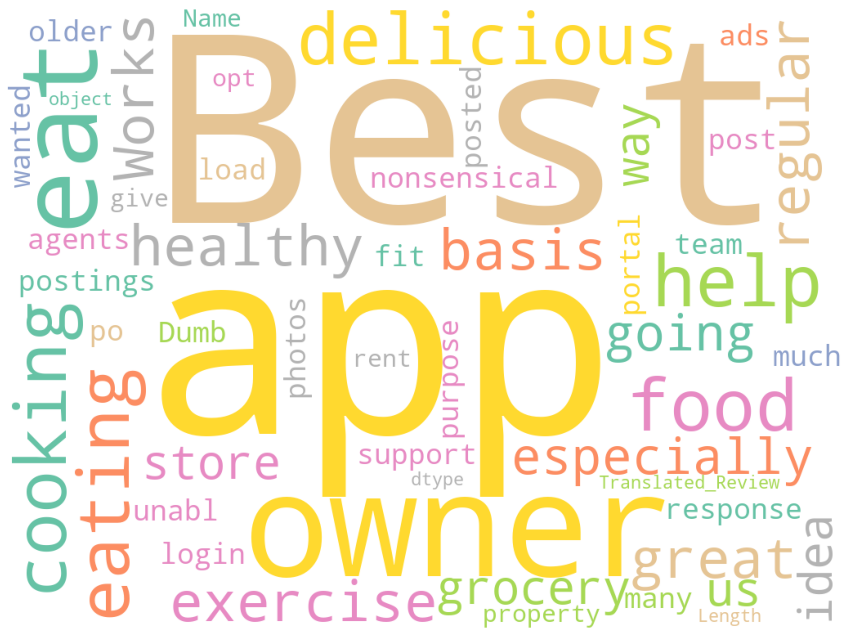

In [103]:
free = merged_df.loc[merged_df.Type == 'Free']['Translated_Review'].apply(
    lambda x: '' if x == 'nan' else x)
wordcloud = WordCloud(background_color="white", width=1024, height=768,
                      max_words=200, colormap="Set2").generate(''.join(str(free)))
plt.figure(figsize=(15, 15))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

### For Free applications<br>
### Positive words: Best, Love, Nice<br>
<br>
### Negative words: Problem, AD,

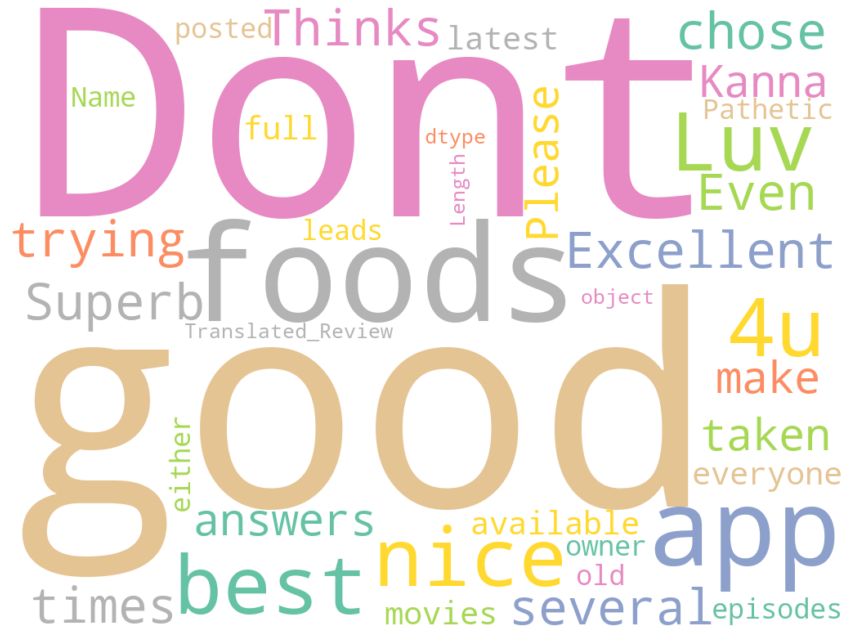

In [104]:
paid = merged_df.loc[merged_df.Type == 'Paid']['Translated_Review'].apply(
    lambda x: '' if x == 'nan' else x)
wordcloud = WordCloud(background_color="white", width=1024,
                      height=768, colormap="Set2").generate(''.join(str(paid)))
plt.figure(figsize=(15, 15))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### For Paid applications<br>
### Positive Words: helpful, nice, amazing<br>
<br>
### Negative Words: glitches, ad

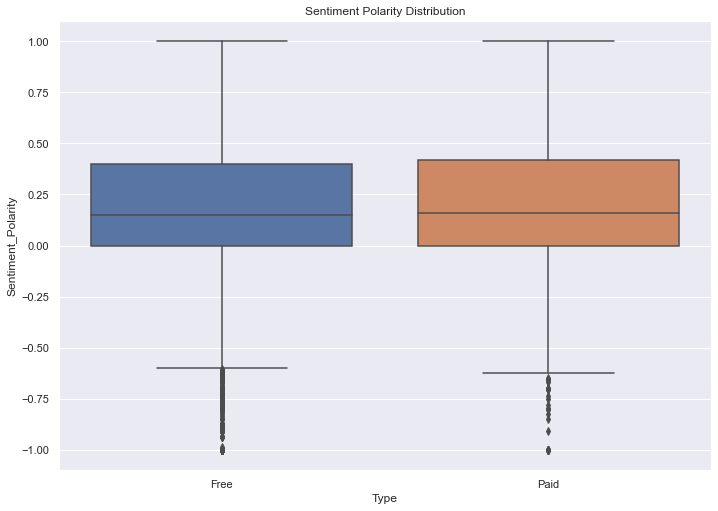

In [106]:
sns.set_style('ticks')
sns.set_style("darkgrid")
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
ax = sns.boxplot(x='Type', y='Sentiment_Polarity', data=merged_df)
title = ax.set_title('Sentiment Polarity Distribution')

### Free apps receive a lot of harsh comments which are indicated as outliers on the negative Y-axis.<br>
<br>
### Users are more lenient and tolerant while reviewing paid apps - moderate choice of words. They are never extremely negative while reviewing a paid app.

## Confusion Matrices

In [107]:
max_features = 50000
cou_vec = CountVectorizer(max_features=max_features, stop_words="english")
sparce_matrix = cou_vec.fit_transform(text_list).toarray()
all_words = cou_vec.get_feature_names()

In [108]:
aw = pd.Series(all_words)
aw.count()
#print("Most used words: ",all_words)

17404

### We use Logistic Regresssion and Random Forest methods to classify the reviews according to sentiments.

## Random Forest Method

In [109]:
y = data.iloc[:, 1].values
x = sparce_matrix
x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.2, random_state=42)

### Accuracy of the model

Random Forest<br>
holdout method/ k-fold method

In [110]:
rf = RandomForestClassifier(n_estimators=10, random_state=42)
rf.fit(x_train, y_train)
print("Accuracy of the model: ", rf.score(x_test, y_test))

Accuracy of the model:  0.877504675394069


### Confusion matrix for error calculation

confussion matrix

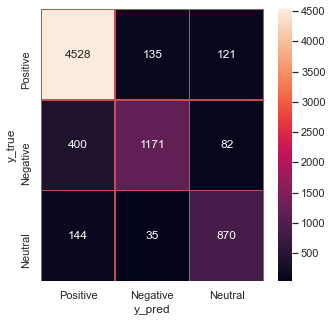

In [111]:
y_pred = rf.predict(x_test)
y_true = y_test
names = ["Positive", "Negative", "Neutral"]
cm = confusion_matrix(y_true, y_pred)
f, ax = plt.subplots(figsize=(5, 5))
sns.heatmap(cm, annot=True, linewidth=.5, linecolor="r", fmt=".0f", ax=ax)
plt.xlabel("y_pred")
plt.ylabel("y_true")
ax.set_xticklabels(names)
ax.set_yticklabels(names)
plt.show()

### Confusion matrix for random forest classifier. It is evident that the majority of the reviews were accurately predicted, there are a total of 400 False Positives and 135 False Negatives with a total of 6569 accurate predictions. The Random Forest Classifier scores an accuracy score of 87.71%.

## Logistic Regression method

### Accuracy of the model

logistic Regression

In [115]:
lr = LogisticRegression(solver='liblinear')
lr.fit(x_train, y_train)
print("Accuracy of the model: ", lr.score(x_test, y_test))

Accuracy of the model:  0.9084958589366818


### Confusion Matrix for error calculation

confussion matrix

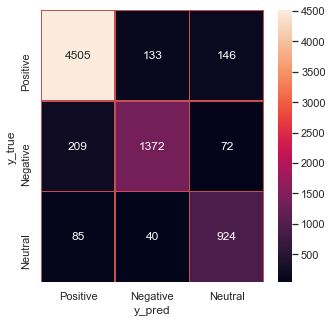

In [116]:
y_pred = lr.predict(x_test)
y_true = y_test
names = ["Positive", "Negative", "Neutral"]
cm = confusion_matrix(y_true, y_pred)
f, ax = plt.subplots(figsize=(5, 5))
sns.heatmap(cm, annot=True, linewidth=.5, linecolor="r", fmt=".0f", ax=ax)
plt.xlabel("y_pred")
plt.ylabel("y_true")
ax.set_xticklabels(names)
ax.set_yticklabels(names)
plt.show()

### Confusion matrix for logistic regression. It is observed that the Logistic regression model used as a classifier performs better than the random forest classifier on the given data set.<br>
### A total of 6802 entries were predicted accurately with 202 false positives and 141 false negatives. Logistic Model produces an accuracy of 90.8% on the user reviews dataset.

=============================================================================================

# PREDICTION OF RATINGS

### For Prediction of ratings we use 3 methods,<br>
1. Linear Regression<br>
2. Support Vector Machine<br>
3. Random Forest Regression

In [117]:
df1 = pd.read_csv("Google-Playstore.csv", squeeze=True)
print(len(df1))
#df1.dropna(inplace = True)
df1 = df1[df1['Rating'] != 0.0]

1118136


In [118]:
print(len(df1))

684871


In [124]:
df1

,App Name,App Id,Category,Rating,Rating Count,Installs,Minimum Installs,Maximum Installs,Type,Price,...,Developer Id,Developer Website,Developer Email,Released,Last Updated,Content Rating,Privacy Policy,Ad Supported,In App Purchases,Editors Choice
0,HTTrack Website Copier,com.httrack.android,Communication,3.6,2848.0,"100,000+",100000.0,351560,1,0.0,...,Xavier Roche,http://www.httrack.com/,roche+android@httrack.com,"Aug 12, 2013","May 20, 2017",0,http://android.httrack.com/privacy-policy.html,False,False,False
1,World War 2: Offline Strategy,com.skizze.wwii,Strategy,4.3,17297.0,"1,000,000+",1000000.0,2161778,1,0.0,...,Skizze Games,http://stereo7.com/,Skizze.Games@gmail.com,"Jul 19, 2018","Nov 26, 2020",1,https://www.iubenda.com/privacy-policy/8032781,True,True,False
2,WPSApp,com.themausoft.wpsapp,Tools,4.2,488639.0,"50,000,000+",50000000.0,79304739,1,0.0,...,TheMauSoft,http://www.themausoft.com,wpsapp.app@gmail.com,"Mar 7, 2016","Oct 21, 2020",0,https://sites.google.com/view/wpsapppolicy/main,True,False,False
3,"OfficeSuite - Office, PDF, Word, Excel, PowerP...",com.mobisystems.office,Business,4.2,1224420.0,"100,000,000+",100000000.0,163660067,1,0.0,...,MobiSystems,http://www.mobisystems.com,support-officesuite-android@mobisystems.com,"Dec 22, 2011","Nov 23, 2020",0,http://www.mobisystems.com/mobile/privacy-poli...,True,True,False
4,Loud Player Free,com.arthelion.loudplayer,Music & Audio,4.2,665.0,"50,000+",50000.0,73463,1,0.0,...,Arthelion92,http://www.arthelion.com,arthelion92@gmail.com,"Sep 24, 2016","Nov 22, 2020",0,http://www.arthelion.com/index.php/fr/android-...,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1118122,Shree Sen Samaj,com.varbin.shreesensamaj,Social,4.6,36.0,"1,000+",1000.0,4258,1,0.0,...,Varbin Softwares,http://varbin.com,varbinsoftware@gmail.com,"Dec 11, 2017","Dec 13, 2017",0,http://varbin.com/shree-sen-samaj-privacy-policy/,False,False,False
1118124,Luncher,com.luncher.app,Productivity,NaN,NaN,10+,10.0,26,1,0.0,...,Imaginnovate,http://www.imaginnovate.com,krishna@imaginnovate.com,NaN,"Jan 07, 2020",0,http://www.imaginnovate.com,False,False,False
1118128,Asset Management,com.fieldenable.assetmanagement,Business,NaN,NaN,100+,100.0,190,1,0.0,...,Imaginnovate,http://www.imaginnovate.com,FieldEnable@imaginnovate.com,NaN,"Mar 09, 2020",0,http://app.fieldenable.com/privacy,False,False,False
1118131,FleetEnable,com.fleetenable.app,Productivity,NaN,NaN,10+,10.0,10,1,0.0,...,Imaginnovate,http://fleetenable.com/,krishna@imaginnovate.com,NaN,"Jun 30, 2020",0,http://fleetenable.com/,False,False,False


dropping of unrelated and unnecessary items

In [120]:
df1 = df1.rename(columns={"Free": "Type"})

#Converting Type classification into binary
def type_cat(types):
    if types == 'True':
        return 0
    else:
        return 1
df1['Type'] = df1['Type'].map(type_cat)

In [121]:
df1['Type'] = df1['Type'].apply(lambda x: str(x).replace(
    'True', '0') if 'True' in str(x) else str(x).replace('False', '1'))
df1.Type.astype(int)
# Cleaning of content rating classification
RatingL = df1['Content Rating'].unique()
RatingDict = {}
for i in range(len(RatingL)):
    RatingDict[RatingL[i]] = i
df1['Content Rating'] = df1['Content Rating'].map(RatingDict).astype(int)



In [126]:
def type_cat(category):
    if category in ['Sports', 'Arcade', 'Action', 'Simulation', 'Role Playing', 'Strategy', 'Racing', 'Board', 'Puzzle', 'Casual', 'Adventure', 'Card']:
        return 'Gaming'
    else:
        return category
df1['Category'] = df1['Category'].map(type_cat)
# Cleaning Categories into integers
CategoryString = df1["Category"]
categoryVal = df1["Category"].unique()
categoryValCount = len(categoryVal)
category_dict = {}
for i in range(0, categoryValCount):
    category_dict[categoryVal[i]] = i
df1["Category_c"] = df1["Category"].map(category_dict).astype(int)

scaling and cleaning size of installation

In [127]:
df1['Size'] = df1['Size'].apply(lambda x: str(x).replace(
    'Varies with device', 'NaN') if 'Varies with device' in str(x) else x)
df1['Size'] = df1['Size'].apply(lambda x: str(
    x).replace('M', '') if 'M' in str(x) else x)
df1['Size'] = df1['Size'].apply(lambda x: str(
    x).replace('G', '') if 'G' in str(x) else x)
df1['Size'] = df1['Size'].apply(lambda x: str(
    x).replace(',', '') if ',' in str(x) else x)
# df['Size'] = df['Size'].apply(lambda x: int(x) if int(x) > 1000)
df1['Size'] = df1['Size'].apply(lambda x: float(
    str(x).replace('k', '')) / 1000 if 'k' in str(x) else x)
df1['Size'] = df1['Size'].astype(float)

filling Size which had NA

In [128]:
df1.Size.fillna(method='ffill', inplace=True)

In [129]:
df1.Installs = df1.Installs.apply(lambda x: str(x).strip('+'))
df1.Installs = df1.Installs.apply(lambda x: str(x).replace(',', ''))
df1.Installs = df1.Installs.replace('Free', np.nan)
df1.Installs = df1.Installs.astype(float)

In [130]:
df1.Price = df1.Price.apply(lambda x: str(x).strip('$'))
df1.Price.astype(float)
df1 = df1.drop(columns=['App Name', 'App Id', 'Rating Count', 'Minimum Installs', 'Maximum Installs', 'Currency', 'Developer Id',
                        'Developer Website', 'Developer Email', 'Last Updated', 'Privacy Policy', 'Ad Supported', 'In App Purchases', 'Editors Choice'])

In [131]:
df1.Rating.fillna(method='ffill', inplace=True)

### for evaluation of error term and to add into results_index for evaluation of error term

In [132]:
def Evaluationmatrix(y_true, y_predict):
    print('Mean Squared Error: ' +
          str(metrics.mean_squared_error(y_true, y_predict)))
    print('Mean absolute Error: ' +
          str(metrics.mean_absolute_error(y_true, y_predict)))
    print('Mean squared Log Error: ' +
          str(metrics.mean_squared_log_error(y_true, y_predict)))

In [133]:
def Evaluationmatrix_dict(y_true, y_predict, name=''):
    dict_matrix = {}
    dict_matrix['Series Name'] = name
    dict_matrix['Mean Squared Error'] = metrics.mean_squared_error(
        y_true, y_predict)
    dict_matrix['Mean Absolute Error'] = metrics.mean_absolute_error(
        y_true, y_predict)
    dict_matrix['Mean Squared Log Error'] = metrics.mean_squared_log_error(
        y_true, y_predict)
    return dict_matrix

In [134]:
df1

,Category,Rating,Installs,Type,Price,Size,Minimum Android,Released,Content Rating,Category_c
0,Communication,3.6,100000.0,1,0.0,2.7,2.3 and up,"Aug 12, 2013",0,0
1,Gaming,4.3,1000000.0,1,0.0,86.0,5.1 and up,"Jul 19, 2018",1,1
2,Tools,4.2,50000000.0,1,0.0,5.8,4.1 and up,"Mar 7, 2016",0,2
3,Business,4.2,100000000.0,1,0.0,59.0,4.4 and up,"Dec 22, 2011",0,3
4,Music & Audio,4.2,50000.0,1,0.0,29.0,5.0 and up,"Sep 24, 2016",0,4
...,...,...,...,...,...,...,...,...,...,...
1118122,Social,4.6,1000.0,1,0.0,12.0,4.1 and up,"Dec 11, 2017",0,28
1118124,Productivity,4.6,10.0,1,0.0,12.0,Varies with device,NaN,0,8
1118128,Business,4.6,100.0,1,0.0,12.0,Varies with device,NaN,0,3
1118131,Productivity,4.6,10.0,1,0.0,12.0,Varies with device,NaN,0,8


In [135]:
df1.dropna(inplace=True)

# Linear Regression

Linear model for ratings

In [276]:
X = df1.drop(labels=['Rating', 'Category',
                     'Minimum Android', 'Released'], axis=1)
y = df1.Rating
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.50)
model = LinearRegression()
model.fit(X_train, y_train)
Results = model.predict(X_test)
pred = pd.Series(Results)
# pred.sort_values()

In [277]:
resultsdf = pd.DataFrame()
resultsdf = resultsdf.from_dict(Evaluationmatrix_dict(
    y_test, Results, name='Linear Model'), orient='Index')
resultsdf = resultsdf.transpose()

In [278]:
print(len(df))
print('The mean rating is: {}'.format(np.mean(df['Rating'])))

677197
The mean rating is: 4.08181208717622


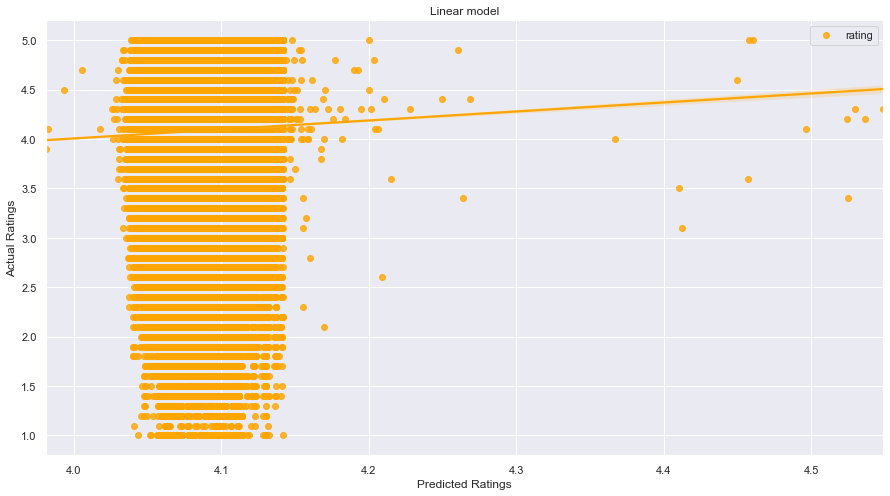

In [165]:
plt.figure(figsize=(15, 8))
sns.regplot(Results, y_test, color='orange', label='rating')
plt.legend()
plt.title('Linear model')
plt.xlabel('Predicted Ratings')
plt.ylabel('Actual Ratings')
plt.show()

### Result

In [279]:
print('Mean Ratings: ' + str(Results.mean()))

Mean Ratings: 4.081966176992807


#### Prediction on single sample with 1 million installs which is free to download and has a size of 500 MB beloning to Gaming category and rated for Everyone

In [330]:
data = [1000000, 0, 0.0, 500.0, 1, 0]
data = np.reshape(data, (1, -1))
model.predict(data)

array([4.01145414])

### Error calculation

In [149]:
print('Mean Squared Error: ' + str(metrics.mean_squared_error(y_test, Results)))
print('Mean absolute Error: ' + str(metrics.mean_absolute_error(y_test, Results)))
print('Mean squared Log Error: ' +
      str(metrics.mean_squared_log_error(y_test, Results)))

Mean Squared Error: 0.41951719898899476
Mean absolute Error: 0.49331383369528364
Mean squared Log Error: 0.020500408654685418


In [150]:
dict1 = {"Mean Squared Error": metrics.mean_squared_error(y_test, Results), "Mean Absolute Error": metrics.mean_absolute_error(y_test, Results),
         "Mean Squared Log Error ": metrics.mean_squared_log_error(y_test, Results)}

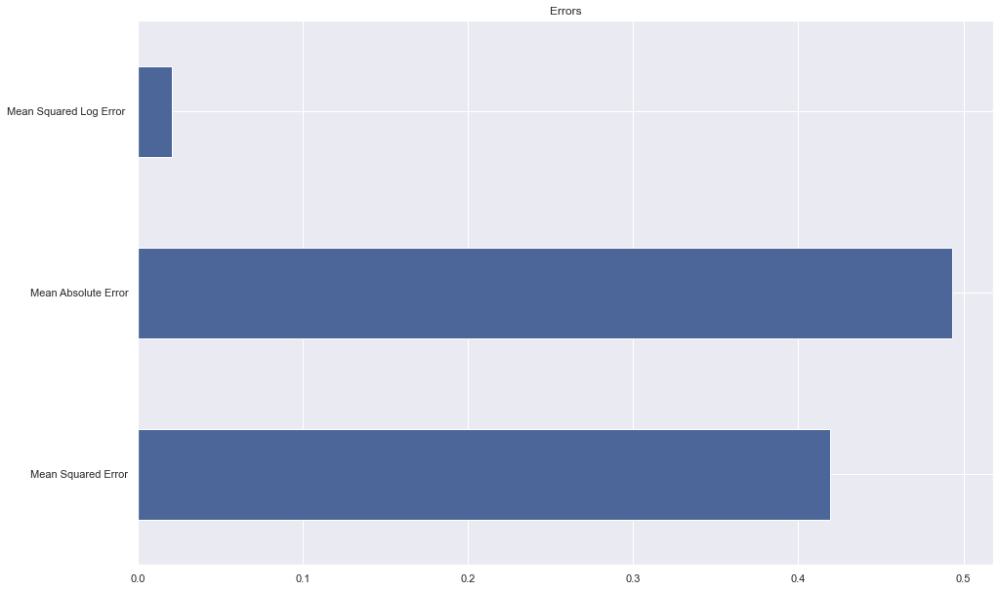

In [151]:
lr = pd.Series(dict1)
lr.plot(kind='barh', color=(0.3, 0.4, 0.6, 1), title='Errors')

In [152]:
resultsdf

,Series Name,Mean Squared Error,Mean Absolute Error,Mean Squared Log Error
0,Linear Model,0.419517,0.493314,0.0205004


# SVM

In[ ]:

In [ ]:
scaling = MinMaxScaler(feature_range=(-1, 1)).fit(X_train)
model2 = svm.SVR()

In [ ]:
X = df1.drop(labels=['Rating', 'Category',
                     'Minimum Android', 'Released'], axis=1)
y = df1.Rating

In [ ]:
X_train = scaling.transform(X_train)
X_test = scaling.transform(X_test)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.50)

In [ ]:
model2.fit(X_train, y_train)

In [ ]:
Results2 = model2.predict(X_test)
pred2 = pd.Series(Results2)
pred2.sort_values()

In [ ]:
resultsdf = resultsdf.append(Evaluationmatrix_dict(
    y_test, Results2, name='SVM model'), ignore_index=True)

In[ ]:

In [ ]:
plt.figure(figsize=(12, 7))
sns.regplot(Results2, y_test, color='orange', label='Ratings')
plt.legend()
plt.title('SVM model')
plt.xlabel('Predicted Ratings')
plt.ylabel('Actual Ratings')
plt.show()

### Results

In[119]:

In [ ]:
print('Mean Ratings: ' + str(Results2.mean()))

### Error Calculation

In[120]:

In [ ]:
print('Mean Squared Error: ' + str(metrics.mean_squared_error(y_test, Results2)))
print('Mean absolute Error: ' + str(metrics.mean_absolute_error(y_test, Results2)))
print('Mean squared Log Error: ' +
      str(metrics.mean_squared_log_error(y_test, Results2)))

In[121]:

In [ ]:
dict2 = {"Mean Squared Error": metrics.mean_squared_error(y_test, Results2), "Mean Absolute Error": metrics.mean_absolute_error(y_test, Results2),
         "Mean Squared Log Error ": metrics.mean_squared_log_error(y_test, Results2)}

In [ ]:
svm = pd.Series(dict2)
svm.plot(kind='barh', color=(0.3, 0.4, 0.6, 1), title='Errors')

In[122]:

In [ ]:
resultsdf

# Random Forest Regression

random forest model for ratings

In [153]:
X = df1.drop(labels=['Rating', 'Category',
                     'Minimum Android', 'Released'], axis=1)
y = df1.Rating
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)
model3 = RandomForestRegressor()
model3.fit(X_train, y_train)
Results3 = model3.predict(X_test)
resultsdf = resultsdf.append(Evaluationmatrix_dict(
    y_test, Results3, name='RFR Model'), ignore_index=True)

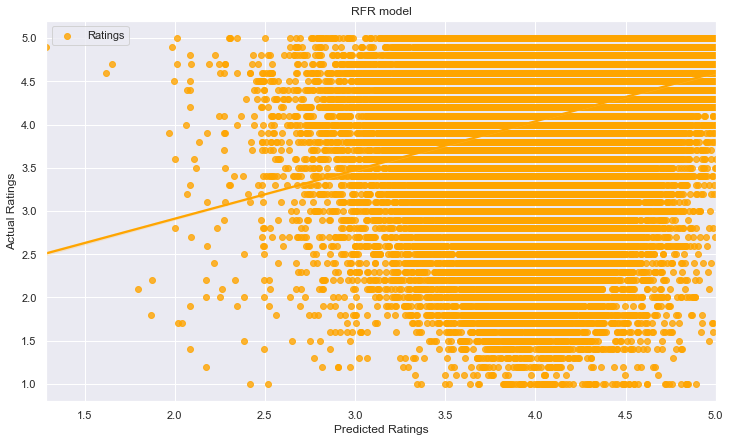

In [154]:
plt.figure(figsize=(12, 7))
sns.regplot(Results3, y_test, color='orange', label='Ratings')
plt.legend()
plt.title('RFR model')
plt.xlabel('Predicted Ratings')
plt.ylabel('Actual Ratings')
plt.show()


### Result

In [155]:
print('Mean Ratings:' + str(Results3.mean()))

Mean Ratings:4.079176584081585


### Error Calculation

In [156]:
print('Mean Squared Error: ' + str(metrics.mean_squared_error(y_test, Results3)))
print('Mean absolute Error: ' + str(metrics.mean_absolute_error(y_test, Results3)))
print('Mean squared Log Error: ' +
      str(metrics.mean_squared_log_error(y_test, Results3)))

Mean Squared Error: 0.40685575634899235
Mean absolute Error: 0.47500915135182686
Mean squared Log Error: 0.01993259284319363


In [157]:
dict3 = {"Mean Squared Error": metrics.mean_squared_error(y_test, Results3), "Mean Absolute Error": metrics.mean_absolute_error(y_test, Results3),
         "Mean Squared Log Error ": metrics.mean_squared_log_error(y_test, Results3)}

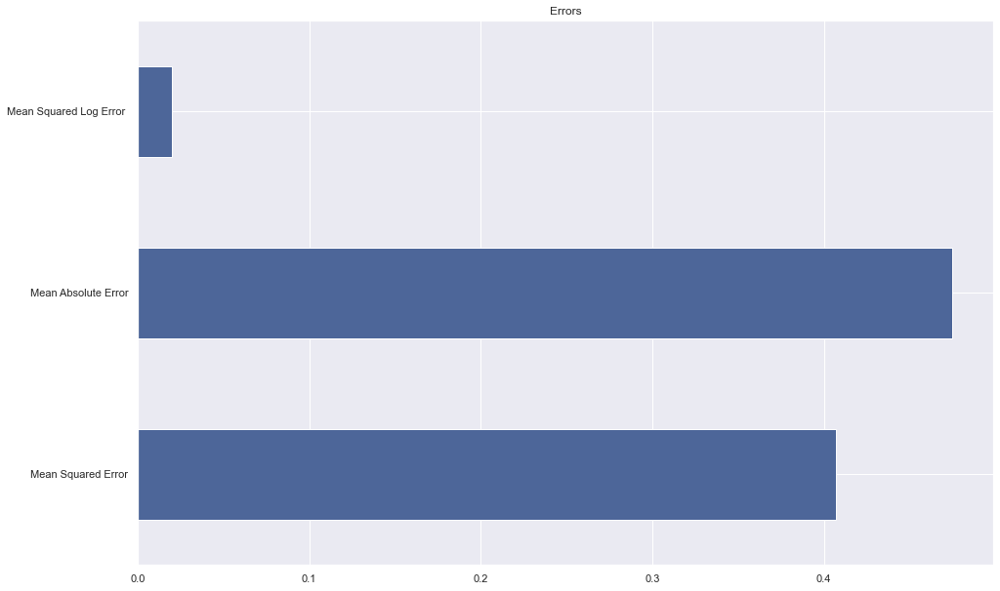

In [158]:
rfr = pd.Series(dict3)
rfr.plot(kind='barh', color=(0.3, 0.4, 0.6, 1), title='Errors')

In [159]:
resultsdf

,Series Name,Mean Squared Error,Mean Absolute Error,Mean Squared Log Error
0,Linear Model,0.419517,0.493314,0.0205004
1,RFR Model,0.406856,0.475009,0.0199326


## Error Calculation Results

In [160]:
resultsdf.set_index('Series Name', inplace=True)

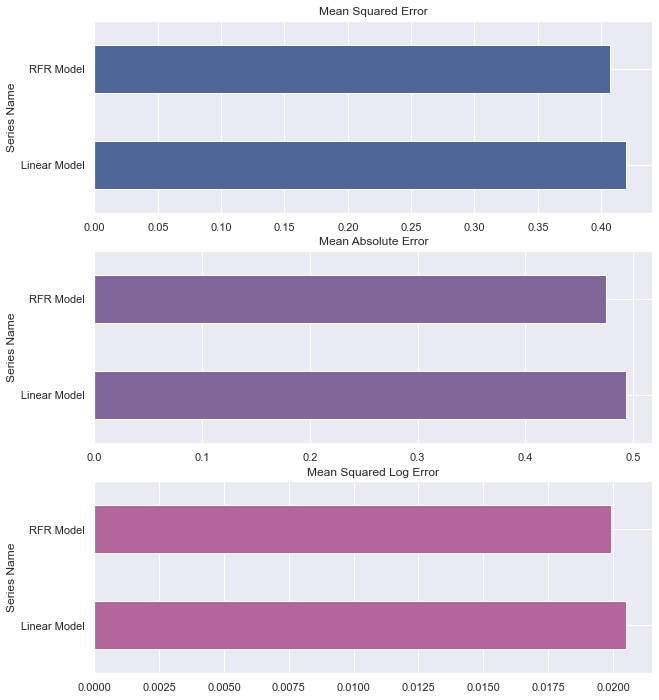

In [161]:
plt.figure(figsize=(10, 12))
plt.subplot(3, 1, 1)
resultsdf['Mean Squared Error'].sort_values(ascending=False).plot(
    kind='barh', color=(0.3, 0.4, 0.6, 1), title='Mean Squared Error')
plt.subplot(3, 1, 2)
resultsdf['Mean Absolute Error'].sort_values(ascending=False).plot(
    kind='barh', color=(0.5, 0.4, 0.6, 1), title='Mean Absolute Error')
plt.subplot(3, 1, 3)
resultsdf['Mean Squared Log Error'].sort_values(ascending=False).plot(
    kind='barh', color=(0.7, 0.4, 0.6, 1), title='Mean Squared Log Error')
plt.show()

=================================================================================================================

# INSIGHTS WE DERIVED

####  1. Average rating of (active) apps on Google Play Store is 4.17.

#### 2. Users prefer to pay for apps that are light-weighted. Thus, a paid app that is bulky may not perform well in the market.

#### 3. Most of the top rated apps are optimally sized between ~2MB to ~40MB - neither too light nor too heavy

#### 4. Most of the top rated apps are optimally priced between 1 USD to  30 USD - neither too cheap nor too expensive.

#### 5.Medical and Family apps are the most expensive and even extend upto 80 USD.

#### 6. Users tend to download a given app more if it has been reviewed by a large number of people.

#### 7. Health and Fitness apps receive more than 85% positive reviews. Game and Social apps receive mixed feedback - 50% positive and 50% negative.

#### 8. Users are more grim and harsh while reviewing free apps than paid apps.

### Linear model for ratings

In [ ]:
X = df1.drop(labels=['Rating', 'Category',
                     'Minimum Android', 'Released'], axis=1)
y = df1.Rating
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.50)
model4 = LinearRegression()
model4.fit(X_train, y_train)
y_test_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

In [ ]:
scores = cross_val_score(model4, X_train, y_train, scoring='r2', cv=10)
scores

In[45]:

step-1: create a cross-validation scheme

In [331]:
folds = KFold(n_splits=100, shuffle=True, random_state=100)

step-2: specify range of hyperparameters to tune

In [332]:
hyper_params = [{'n_features_to_select': list(range(1, 7))}]

step-3: perform grid search<br>
3.1 specify model

In [333]:
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm)

3.2 call GridSearchCV()

In [338]:
model_cv = GridSearchCV(estimator=rfe,
                        param_grid=hyper_params,
                        scoring='r2',
                        cv=folds,
                        verbose=1,
                        return_train_score=True)

fit the model

In [339]:
model_cv.fit(X_train, y_train)

Fitting 100 folds for each of 6 candidates, totalling 600 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:  8.2min finished


GridSearchCV(cv=KFold(n_splits=100, random_state=100, shuffle=True),
             estimator=RFE(estimator=LinearRegression()),
             param_grid=[{'n_features_to_select': [1, 2, 3, 4, 5, 6]}],
             return_train_score=True, scoring='r2', verbose=1)

cv results

In [340]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split92_train_score,split93_train_score,split94_train_score,split95_train_score,split96_train_score,split97_train_score,split98_train_score,split99_train_score,mean_train_score,std_train_score
0,0.583678,0.020061,0.004320,0.000824,1,{'n_features_to_select': 1},0.000025,-0.000074,0.000136,0.000183,...,0.000022,0.000021,0.000024,0.000023,0.000022,0.000020,0.000022,0.000020,0.000022,0.000001
1,0.602937,0.059568,0.004659,0.000892,2,{'n_features_to_select': 2},-0.001850,0.001556,0.001743,0.001698,...,0.000969,0.000966,0.000969,0.000976,0.000949,0.000969,0.000977,0.000968,0.000967,0.000009
2,0.559413,0.028365,0.005516,0.001060,3,{'n_features_to_select': 3},-0.001917,0.001359,0.001784,0.001818,...,0.000986,0.000984,0.000990,0.000997,0.000968,0.000989,0.000996,0.000986,0.000987,0.000009
3,0.506036,0.009142,0.005706,0.000692,4,{'n_features_to_select': 4},-0.001960,0.001497,0.001983,0.001801,...,0.000997,0.000995,0.001000,0.001008,0.000980,0.001002,0.001007,0.000997,0.000998,0.000010
4,0.462273,0.024461,0.005766,0.001079,5,{'n_features_to_select': 5},-0.001944,0.001511,0.002063,0.001817,...,0.001008,0.001006,0.001011,0.001019,0.000991,0.001013,0.001017,0.001008,0.001009,0.000010
5,0.393148,0.015968,0.006743,0.001057,6,{'n_features_to_select': 6},-0.001944,0.001511,0.002063,0.001817,...,0.001008,0.001006,0.001011,0.001019,0.000991,0.001013,0.001017,0.001008,0.001009,0.000010


plotting cv results

In [341]:
plt.figure(figsize=(16, 6))

<Figure size 1152x432 with 0 Axes>

<Figure size 1152x432 with 0 Axes>

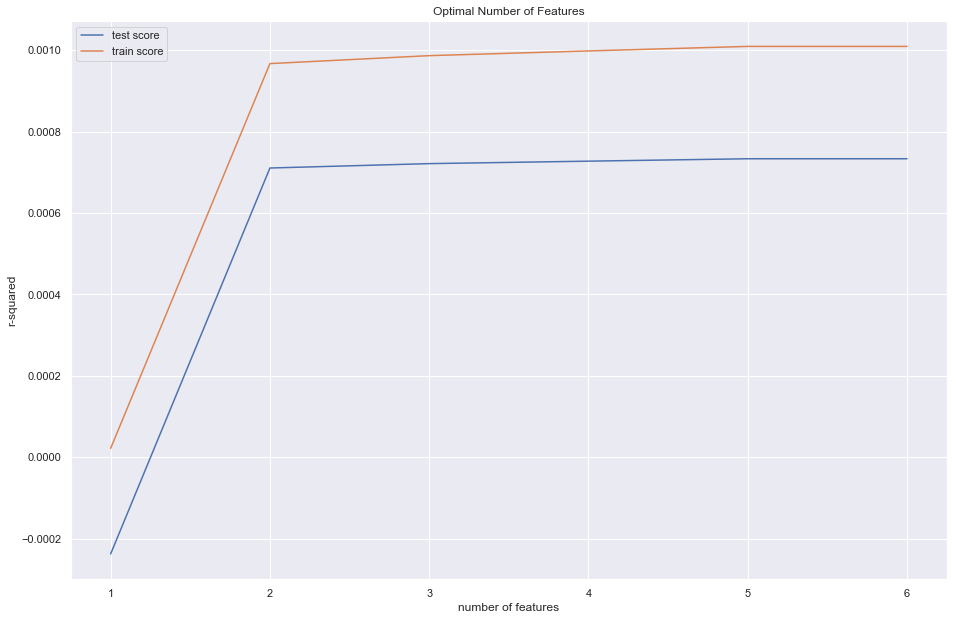

In [342]:
plt.plot(cv_results["param_n_features_to_select"],
         cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"],
         cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

final model

In [343]:
n_features_optimal = 4

In [344]:
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression()

In [345]:
rfe = RFE(lm, n_features_to_select=n_features_optimal)
rfe = rfe.fit(X_train, y_train)

predict prices of X_test

In [346]:
y_pred = lm.predict(X_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

0.0009915483111272438


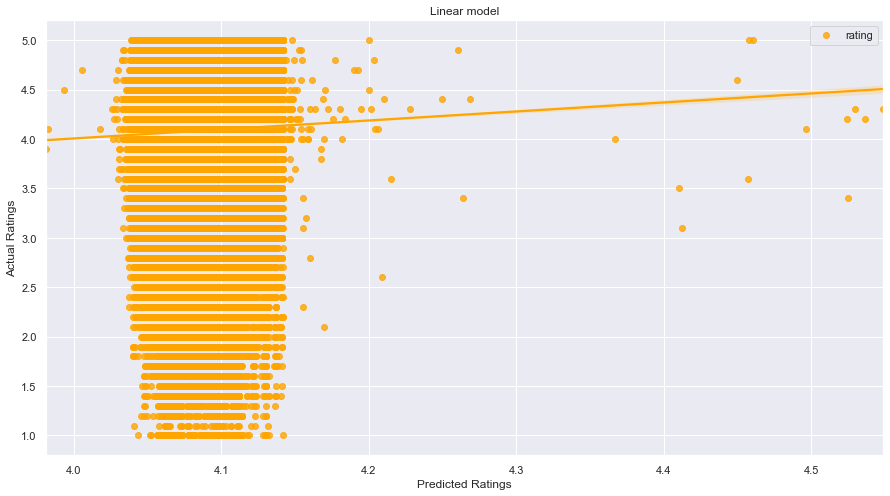

In [250]:
plt.figure(figsize=(15, 8))
sns.regplot(y_pred, y_test, color='orange', label='rating')
plt.legend()
plt.title('Linear model')
plt.xlabel('Predicted Ratings')
plt.ylabel('Actual Ratings')
plt.show()

In [347]:
print('Mean Ratings: ' + str(y_pred.mean()))

Mean Ratings: 4.081966176992807


In [348]:
print('Mean Squared Error: ' + str(metrics.mean_squared_error(y_test, y_pred)))
print('Mean absolute Error: ' + str(metrics.mean_absolute_error(y_test, y_pred)))
print('Mean squared Log Error: ' +
      str(metrics.mean_squared_log_error(y_test, y_pred)))

Mean Squared Error: 0.41885142007990406
Mean absolute Error: 0.4932875134742726
Mean squared Log Error: 0.020437095421739077


In [349]:
data = [1000000, 0, 0.0, 500.0, 0, 1]
data = np.reshape(data, (1, -1))
lm.predict(data)

array([4.01363076])

In [350]:
scores = cross_val_score(lm, X_train, y_train, scoring='r2', cv=10)
scores

array([0.00076273, 0.00091282, 0.00111156, 0.00082354, 0.00080917,
       0.00082255, 0.00133149, 0.00075745, 0.00050907, 0.00131574])